In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import BaggingClassifier, AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import precision_score, recall_score, roc_curve, f1_score, classification_report, auc
from sklearn.cluster import KMeans
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
from imblearn.under_sampling import ClusterCentroids
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

In [2]:
nm_df = pd.read_csv("NetworkMeasuresFeatures.csv")

In [3]:
nm_df_orig = nm_df.copy()

In [4]:
# Renaming columns in readable format to understand what each column represents.
nm_df = nm_df_orig.copy()
col_names = ['Actor', 'A_Acc',
             'PartyPlay_InDegree', 'PartyPlay_OutDegree', 'PartyPlay_Degree',
             'PartyPlay_WeightedDegree', 'PartyPlay_WeightedInDegree', 'PartyPlay_WeightedOutDegree',
             'PartyPlay_Eccentricity', 'PartyPlay_ClosenessCentrality', 'PartyPlay_BetweennessCentrality',
             'PartyPlay_Authority', 'PartyPlay_Hub', 'PartyPlay_ModularityClass', 'PartyPlay_Pagerank',
             'PartyPlay_ComponentId', 'PartyPlay_StrConnId', 'PartyPlay_ClusteringCoefficient', 'PartyPlay_Eigenvector',
             'Friendship_InDegree', 'Friendship_OutDegree', 'Friendship_Degree',
             'Friendship_WeightedDegree', 'Friendship_WeightedInDegree', 'Friendship_WeightedOutDegree',
             'Friendship_Eccentricity', 'Friendship_ClosenessCentrality', 'Friendship_BetweennessCentrality',
             'Friendship_Authority', 'Friendship_Hub', 'Friendship_ModularityClass', 'Friendship_Pagerank',
             'Friendship_ComponentId', 'Friendship_StrConnId', 'Friendship_ClusteringCoefficient', 'Friendship_Eigenvector',
             'Trade_InDegree', 'Trade_OutDegree', 'Trade_Degree',
             'Trade_WeightedDegree', 'Trade_WeightedInDegree', 'Trade_WeightedOutDegree',
             'Trade_Eccentricity', 'Trade_ClosenessCentrality', 'Trade_BetweennessCentrality',
             'Trade_Authority', 'Trade_Hub', 'Trade_ModularityClass', 'Trade_Pagerank',
             'Trade_ComponentId', 'Trade_StrConnId', 'Trade_ClusteringCoefficient', 'Trade_Eigenvector',
             'Whisper_InDegree', 'Whisper_OutDegree', 'Whisper_Degree',
             'Whisper_WeightedDegree', 'Whisper_WeightedInDegree', 'Whisper_WeightedOutDegree',
             'Whisper_Eccentricity', 'Whisper_ClosenessCentrality', 'Whisper_BetweennessCentrality',
             'Whisper_Authority', 'Whisper_Hub', 'Whisper_ModularityClass', 'Whisper_Pagerank',
             'Whisper_ComponentId', 'Whisper_StrConnId', 'Whisper_ClusteringCoefficient', 'Whisper_Eigenvector',
             'Mail_InDegree', 'Mail_OutDegree', 'Mail_Degree',
             'Mail_WeightedDegree', 'Mail_WeightedInDegree', 'Mail_WeightedOutDegree',
             'Mail_Eccentricity', 'Mail_ClosenessCentrality', 'Mail_BetweennessCentrality',
             'Mail_Authority', 'Mail_Hub', 'Mail_ModularityClass', 'Mail_Pagerank',
             'Mail_ComponentId', 'Mail_StrConnId', 'Mail_ClusteringCoefficient', 'Mail_Eigenvector',
             'Shop_InDegree', 'Shop_OutDegree', 'Shop_Degree',
             'Shop_WeightedDegree', 'Shop_WeightedInDegree', 'Shop_WeightedOutDegree',
             'Shop_Eccentricity', 'Shop_ClosenessCentrality', 'Shop_BetweennessCentrality',
             'Shop_Authority', 'Shop_Hub', 'Shop_ModularityClass', 'Shop_Pagerank',
             'Shop_ComponentId', 'Shop_StrConnId', 'Shop_ClusteringCoefficient', 'Shop_Eigenvector',
             'Type'
            ]
nm_df.columns = col_names
nm_df_orig.columns = col_names

In [5]:
# Change Type as Category
nm_df.Type = nm_df.Type.astype('category')

In [6]:
# Creating a numerical field for Type
nm_df.Type.replace({'Human': 0, 'Bot': 1}, inplace=True)

In [7]:
type_dict = {0 : 'Human', 1: 'Bot'}

In [8]:
# Creating different datasets based on the Group activity
party_df = nm_df[[
                  'PartyPlay_InDegree', 'PartyPlay_OutDegree', 'PartyPlay_Degree',
                  'PartyPlay_WeightedDegree', 'PartyPlay_WeightedInDegree', 'PartyPlay_WeightedOutDegree',
                  'PartyPlay_Eccentricity', 'PartyPlay_ClosenessCentrality', 'PartyPlay_BetweennessCentrality',
                  'PartyPlay_Authority', 'PartyPlay_Hub', 'PartyPlay_ModularityClass', 'PartyPlay_Pagerank',
                  'PartyPlay_ComponentId', 'PartyPlay_StrConnId', 'PartyPlay_ClusteringCoefficient',
                  'PartyPlay_Eigenvector', 'Type']].copy()
friendship_df = nm_df[['Friendship_InDegree', 'Friendship_OutDegree', 'Friendship_Degree',
                       'Friendship_WeightedDegree', 'Friendship_WeightedInDegree', 'Friendship_WeightedOutDegree',
                       'Friendship_Eccentricity', 'Friendship_ClosenessCentrality', 'Friendship_BetweennessCentrality',
                       'Friendship_Authority', 'Friendship_Hub', 'Friendship_ModularityClass', 'Friendship_Pagerank',
                       'Friendship_ComponentId', 'Friendship_StrConnId', 'Friendship_ClusteringCoefficient', 'Friendship_Eigenvector',
                       'Type']].copy()
trade_df = nm_df[[
    'Trade_InDegree', 'Trade_OutDegree', 'Trade_Degree',
    'Trade_WeightedDegree', 'Trade_WeightedInDegree', 'Trade_WeightedOutDegree',
    'Trade_Eccentricity', 'Trade_ClosenessCentrality', 'Trade_BetweennessCentrality',
    'Trade_Authority', 'Trade_Hub', 'Trade_ModularityClass', 'Trade_Pagerank',
    'Trade_ComponentId', 'Trade_StrConnId', 'Trade_ClusteringCoefficient', 'Trade_Eigenvector',
    'Type']].copy()
shop_df = nm_df[[
             'Shop_InDegree', 'Shop_OutDegree', 'Shop_Degree',
             'Shop_WeightedDegree', 'Shop_WeightedInDegree', 'Shop_WeightedOutDegree',
             'Shop_Eccentricity', 'Shop_ClosenessCentrality', 'Shop_BetweennessCentrality',
             'Shop_Authority', 'Shop_Hub', 'Shop_ModularityClass', 'Shop_Pagerank',
             'Shop_ComponentId', 'Shop_StrConnId', 'Shop_ClusteringCoefficient', 'Shop_Eigenvector',
             'Type']].copy()
whisper_df = nm_df[[
    'Whisper_InDegree', 'Whisper_OutDegree', 'Whisper_Degree',
    'Whisper_WeightedDegree', 'Whisper_WeightedInDegree', 'Whisper_WeightedOutDegree',
    'Whisper_Eccentricity', 'Whisper_ClosenessCentrality', 'Whisper_BetweennessCentrality',
    'Whisper_Authority', 'Whisper_Hub', 'Whisper_ModularityClass', 'Whisper_Pagerank',
    'Whisper_ComponentId', 'Whisper_StrConnId', 'Whisper_ClusteringCoefficient', 'Whisper_Eigenvector',
    'Type' ]].copy()
mail_df = nm_df[[
    'Mail_InDegree', 'Mail_OutDegree', 'Mail_Degree',
    'Mail_WeightedDegree', 'Mail_WeightedInDegree', 'Mail_WeightedOutDegree',
    'Mail_Eccentricity', 'Mail_ClosenessCentrality', 'Mail_BetweennessCentrality',
    'Mail_Authority', 'Mail_Hub', 'Mail_ModularityClass', 'Mail_Pagerank',
    'Mail_ComponentId', 'Mail_StrConnId', 'Mail_ClusteringCoefficient', 'Mail_Eigenvector',
    'Type']].copy()


In [9]:
# Getting the list of cols that we want to visulaize in pairplot. This will exclude the Actor and A_Acc cols
cols = party_df.columns.tolist()
#cols.remove('Actor'); cols.remove('A_Acc')
print(cols)

['PartyPlay_InDegree', 'PartyPlay_OutDegree', 'PartyPlay_Degree', 'PartyPlay_WeightedDegree', 'PartyPlay_WeightedInDegree', 'PartyPlay_WeightedOutDegree', 'PartyPlay_Eccentricity', 'PartyPlay_ClosenessCentrality', 'PartyPlay_BetweennessCentrality', 'PartyPlay_Authority', 'PartyPlay_Hub', 'PartyPlay_ModularityClass', 'PartyPlay_Pagerank', 'PartyPlay_ComponentId', 'PartyPlay_StrConnId', 'PartyPlay_ClusteringCoefficient', 'PartyPlay_Eigenvector', 'Type']


In [10]:
models = []
models.append(("LR", LogisticRegression()))
#models.append(("LDA", LinearDiscriminantAnalysis()))
#models.append(("KNN", KNeighborsClassifier()))
#models.append(("Tree", DecisionTreeClassifier()))
#models.append(("NB", GaussianNB()))
#models.append(("SVC", SVC()))

In [11]:
cols_to_take = [
    'Actor', 'A_Acc',         
    'PartyPlay_InDegree', 'PartyPlay_OutDegree', 'PartyPlay_WeightedInDegree', 'PartyPlay_WeightedOutDegree',
    'PartyPlay_ClusteringCoefficient',
    'Friendship_InDegree', 'Friendship_OutDegree', 'Friendship_WeightedInDegree', 'Friendship_WeightedOutDegree',
    'Friendship_ClusteringCoefficient',
    'Trade_InDegree', 'Trade_OutDegree', 'Trade_WeightedInDegree', 'Trade_WeightedOutDegree',
    'Trade_ClusteringCoefficient',
    'Mail_InDegree', 'Mail_OutDegree', 'Mail_WeightedInDegree', 'Mail_WeightedOutDegree',
    'Mail_ClusteringCoefficient',
    'Shop_InDegree', 'Shop_OutDegree', 'Shop_WeightedInDegree', 'Shop_WeightedOutDegree',
    'Shop_ClusteringCoefficient', 
    'Whisper_InDegree', 'Whisper_OutDegree', 'Whisper_WeightedInDegree', 'Whisper_WeightedOutDegree',
    'Whisper_ClusteringCoefficient',
    'PartyPlay_Degree', 'PartyPlay_WeightedDegree', 
    'Friendship_Degree', 'Friendship_WeightedDegree', 
    'Trade_Degree', 'Trade_WeightedDegree', 
    'Shop_Degree', 'Shop_WeightedDegree', 
    'Mail_Degree', 'Mail_WeightedDegree', 
    'Type']

In [ ]:
# Standardizing the below columns to make the values comparable

In [12]:
cols_to_zscore = {
    'party_play': ['PartyPlay_BetweennessCentrality', 'PartyPlay_ClosenessCentrality', 
    'PartyPlay_Eigenvector', 'PartyPlay_Eccentricity', 'PartyPlay_Authority', 'PartyPlay_Hub', 'PartyPlay_Pagerank'],
    'friendship': ['Friendship_BetweennessCentrality', 'Friendship_ClosenessCentrality', 
    'Friendship_Eigenvector', 'Friendship_Eccentricity', 'Friendship_Authority', 'Friendship_Hub', 'Friendship_Pagerank'],
    'trade': ['Trade_BetweennessCentrality',  'Trade_ClosenessCentrality',
    'Trade_Eigenvector', 'Trade_Eccentricity', 'Trade_Authority', 'Trade_Hub', 'Trade_Pagerank'],
    'shop': ['Shop_BetweennessCentrality', 'Shop_ClosenessCentrality',
    'Shop_Eigenvector', 'Shop_Eccentricity', 'Shop_Authority', 'Shop_Hub', 'Shop_Pagerank'],
    'mail': ['Mail_BetweennessCentrality', 'Mail_ClosenessCentrality', 
    'Mail_Eigenvector', 'Mail_Eccentricity', 'Mail_Authority', 'Mail_Hub', 'Mail_Pagerank'],
    'whisper': ['Whisper_BetweennessCentrality', 'Whisper_ClosenessCentrality', 
    'Whisper_Eigenvector', 'Whisper_Eccentricity', 'Whisper_Authority', 'Whisper_Hub', 'Whisper_Pagerank']
}

In [13]:
grp_act_df = {
    'party_play': party_df,
    'friendship': friendship_df,
    'trade': trade_df,
    'shop': shop_df,
    'mail': mail_df,
    'whisper': whisper_df
}

In [14]:
# For each act_df, apply zscore to the cols listed in cols_to_zscore
for act_name, act_df in grp_act_df.items():
    act_cols_to_zscore = cols_to_zscore.get(act_name)
    act_df[act_cols_to_zscore] = act_df[act_cols_to_zscore].apply(zscore)

# Pairplot analysis

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:494: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X,a,b,gridsize)/(delta*nobs)
/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/anaconda3/lib/python3.6/site-packages/numpy/core/_met

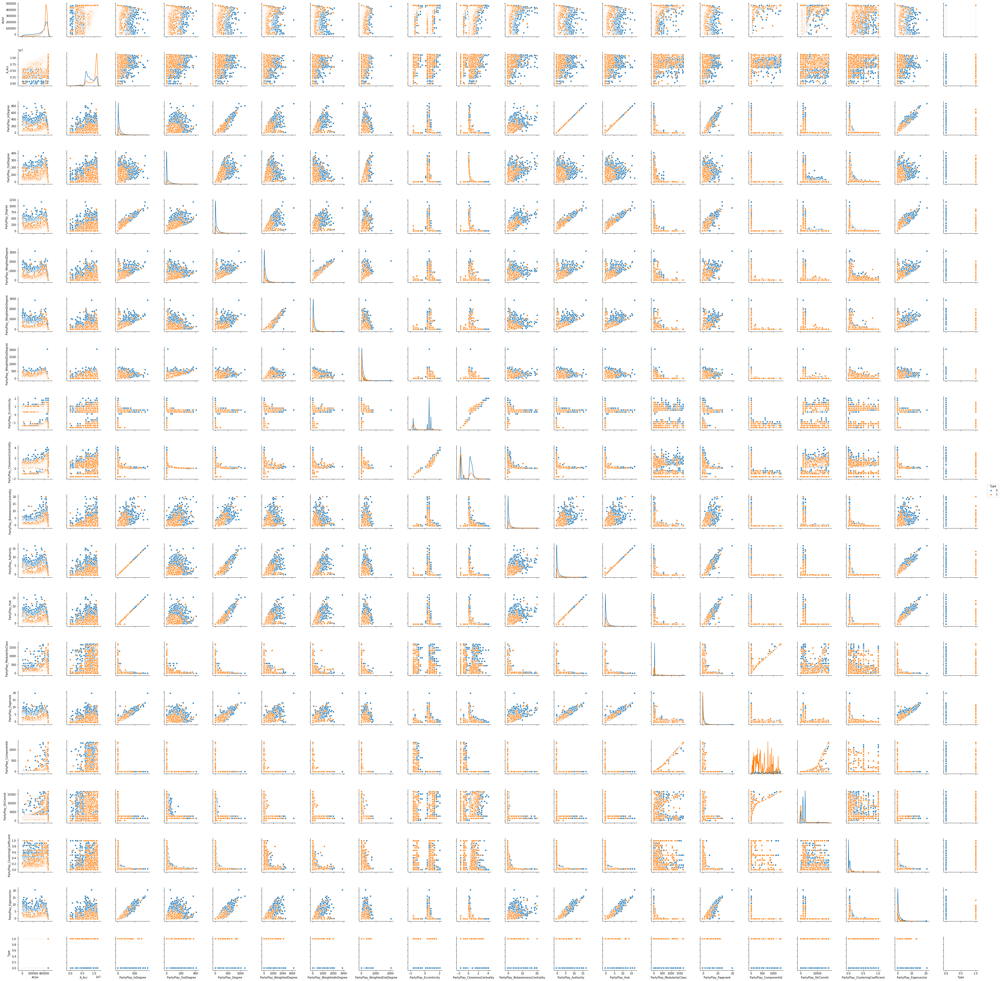

In [20]:
sns.pairplot(party_df, diag_kind="kde", hue="Type")

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:494: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X,a,b,gridsize)/(delta*nobs)
/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/anaconda3/lib/python3.6/site-packages/numpy/core/_met

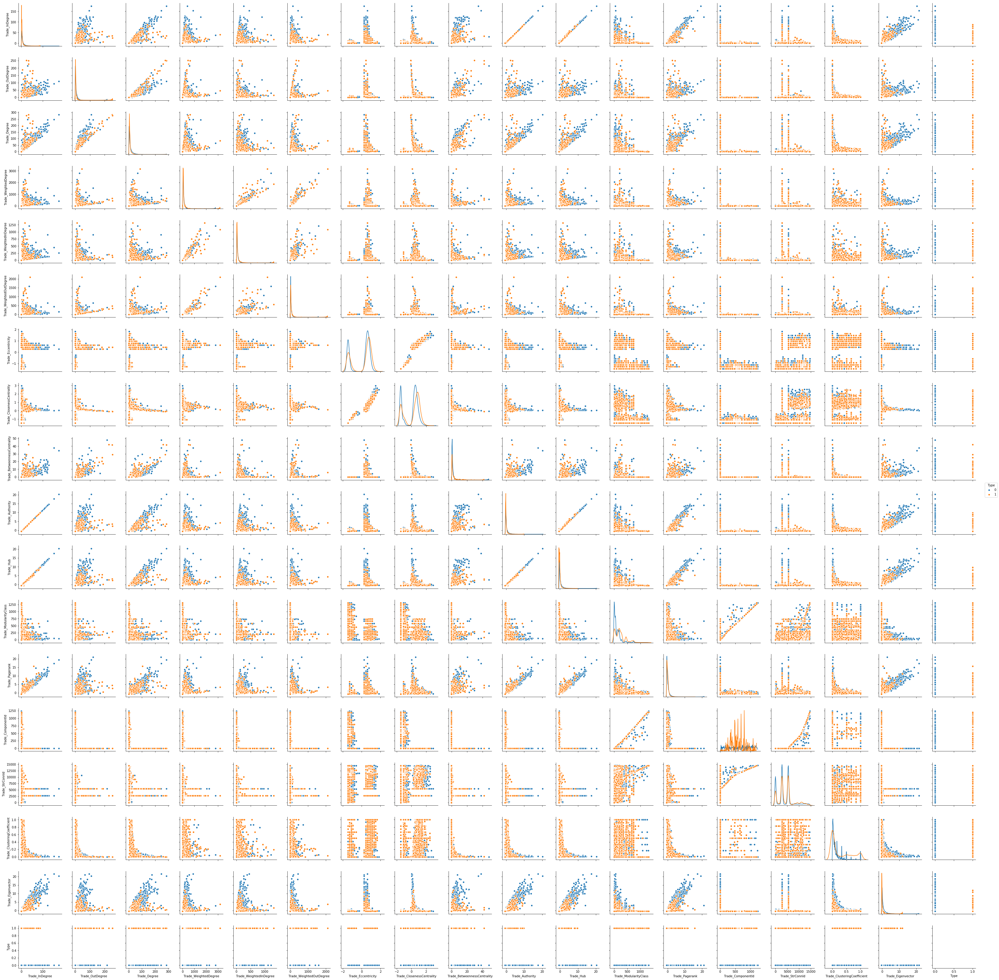

In [21]:
sns.pairplot(trade_df, diag_kind="kde", hue="Type")

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:494: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X,a,b,gridsize)/(delta*nobs)
/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/anaconda3/lib/python3.6/site-packages/numpy/core/_met

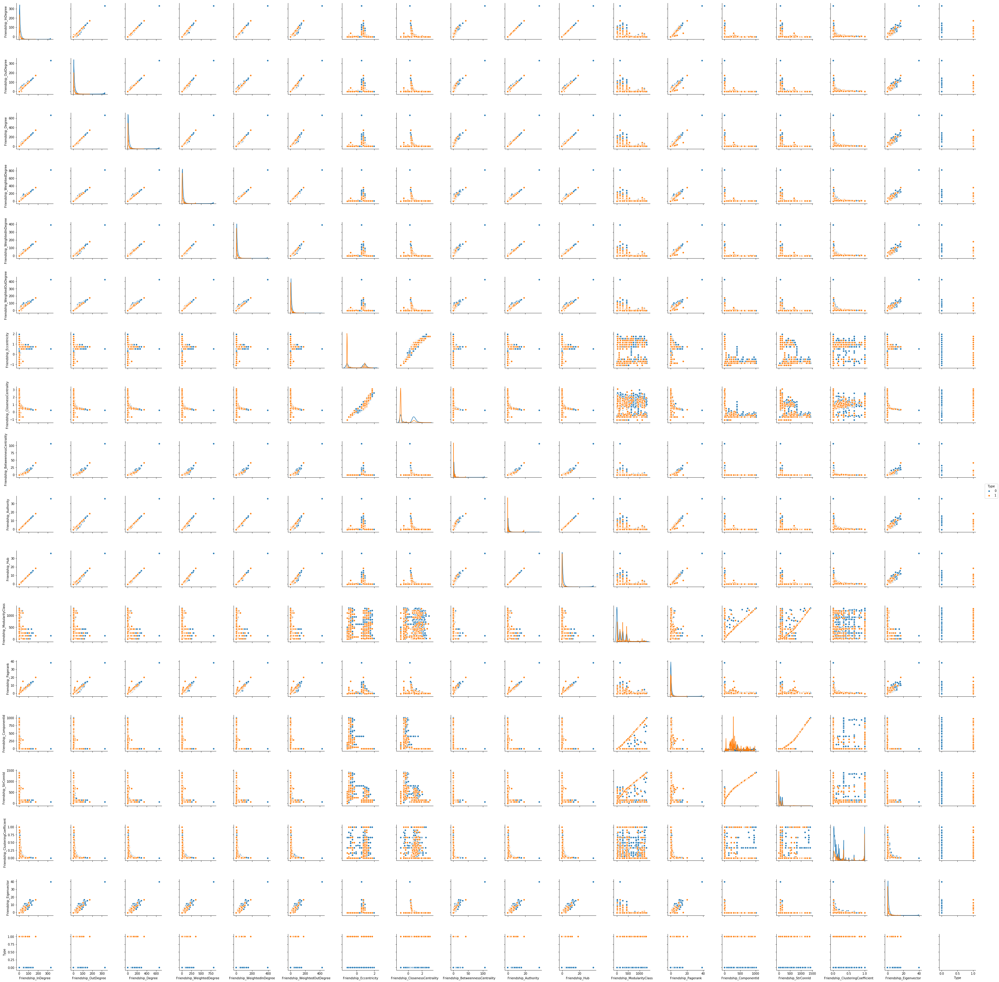

In [22]:
sns.pairplot(friendship_df, diag_kind="kde", hue="Type")

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:494: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X,a,b,gridsize)/(delta*nobs)
/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/anaconda3/lib/python3.6/site-packages/numpy/core/_met

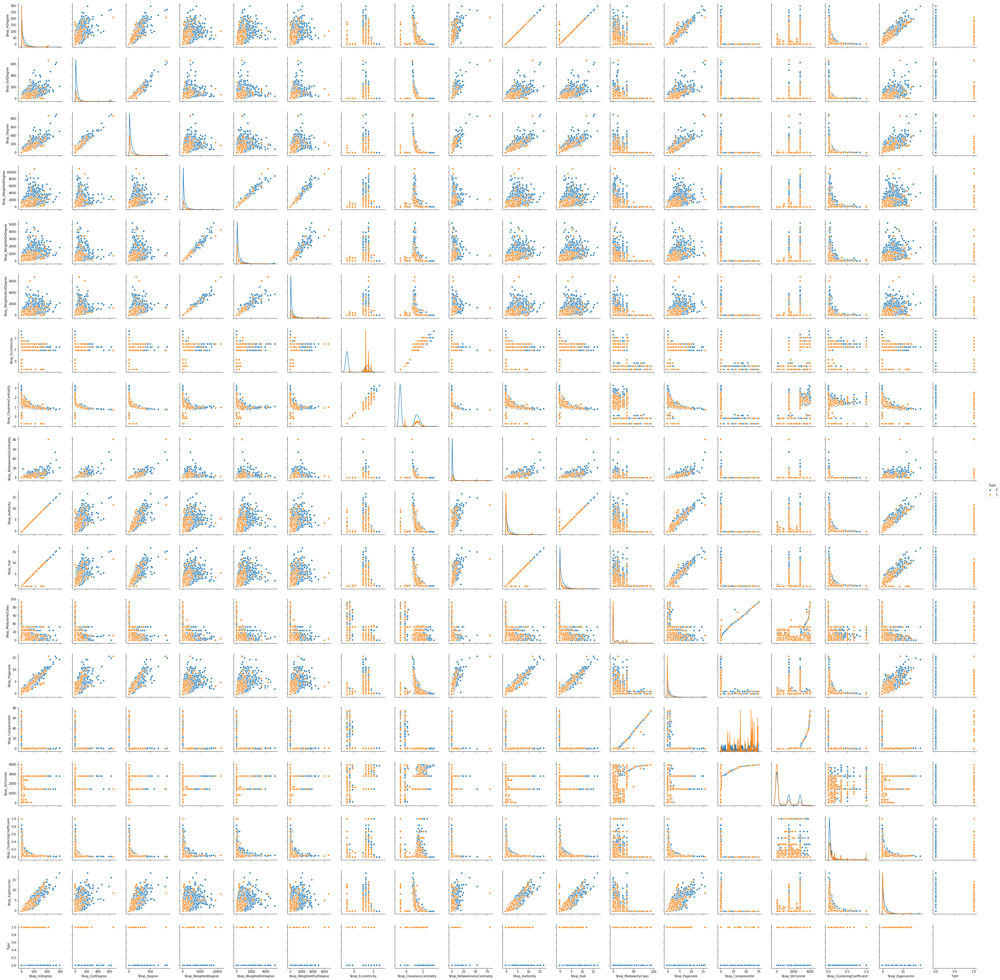

In [23]:
sns.pairplot(shop_df, diag_kind="kde", hue="Type")

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:494: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X,a,b,gridsize)/(delta*nobs)
/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/anaconda3/lib/python3.6/site-packages/numpy/core/_met

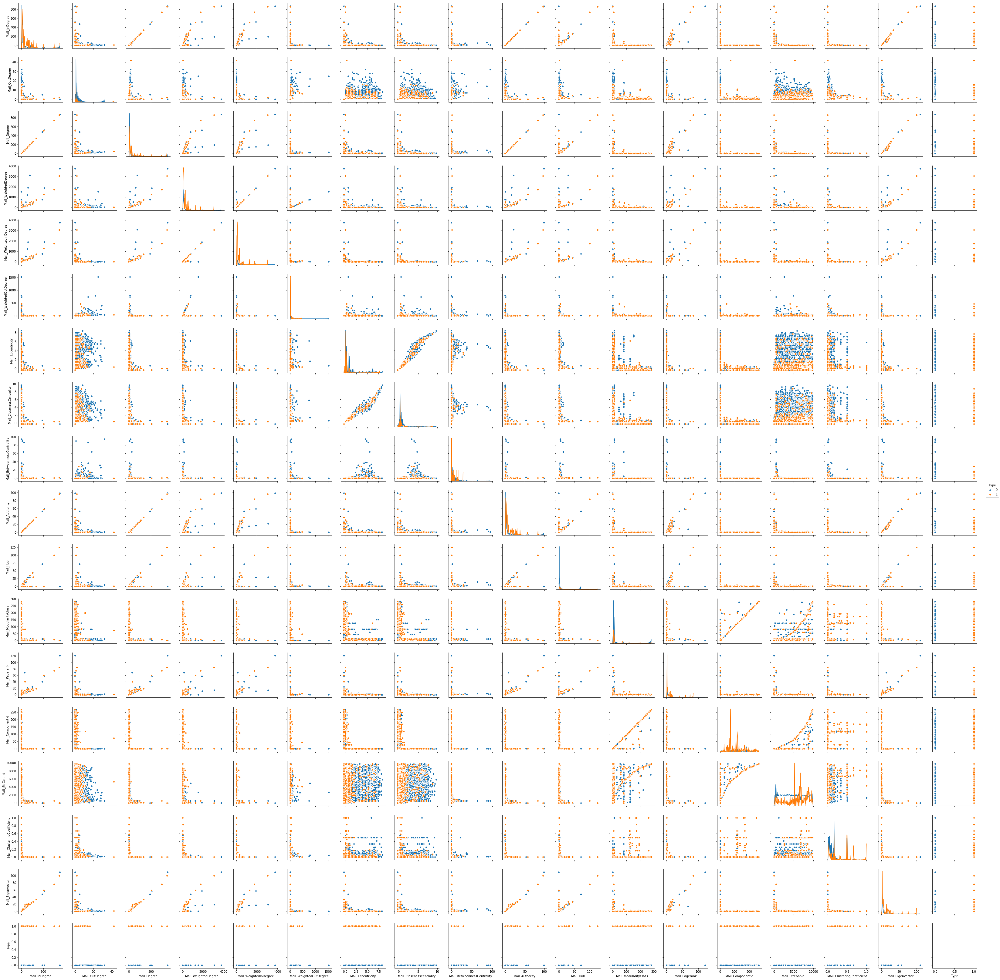

In [24]:
sns.pairplot(mail_df, diag_kind="kde", hue="Type")

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


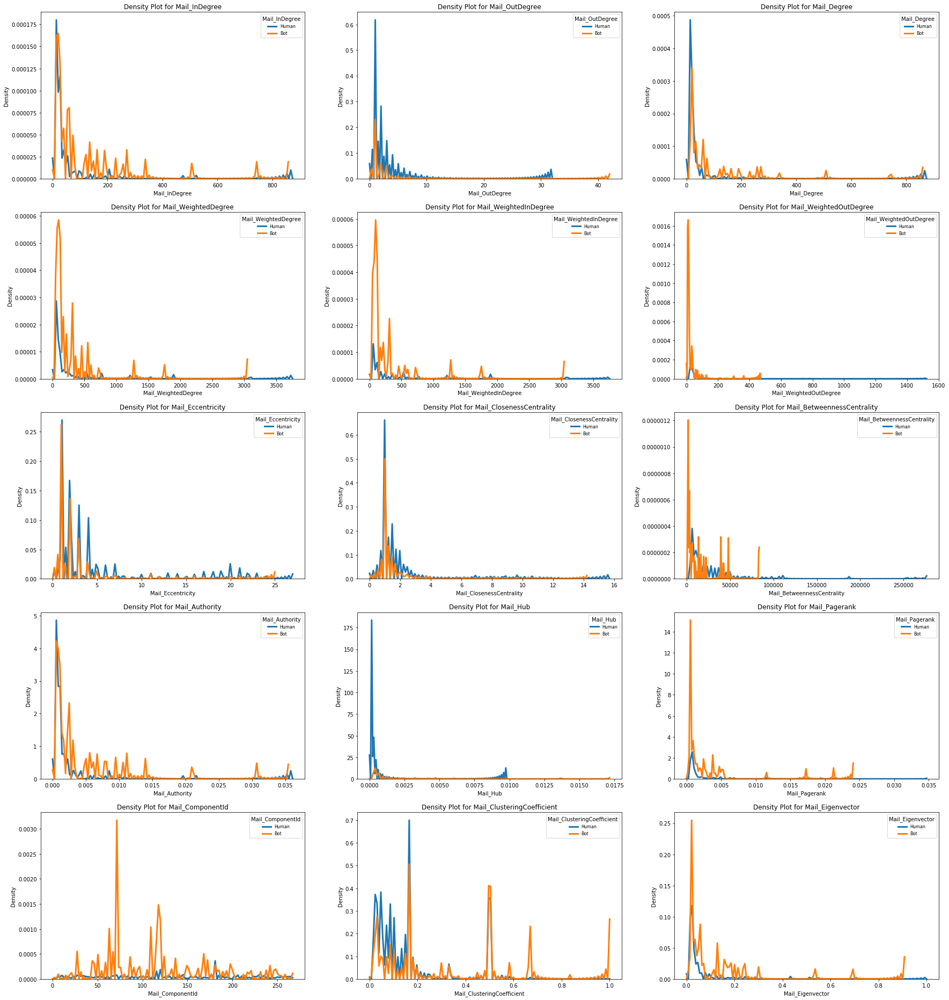

In [51]:
grid_spec = plt.GridSpec(nrows=6, ncols=3, wspace=0.2, hspace=0.2)

cols_to_view = [
    'Mail_InDegree', 'Mail_OutDegree', 'Mail_Degree',
    'Mail_WeightedDegree', 'Mail_WeightedInDegree', 'Mail_WeightedOutDegree',
    'Mail_Eccentricity', 'Mail_ClosenessCentrality', 'Mail_BetweennessCentrality',
    'Mail_Authority', 'Mail_Hub', 'Mail_Pagerank',
    'Mail_ComponentId', 'Mail_ClusteringCoefficient', 'Mail_Eigenvector',]

cols_to_view_arr = np.array(cols_to_view)
cols_to_view_arr = np.squeeze(cols_to_view_arr)
cols_to_view_matrix = cols_to_view_arr.reshape(5, 3)
#print(cols_to_view_matrix)

plt.figure(figsize=(30,40))
for x in range(5):
    for y in range(3):
        col = cols_to_view_matrix[x, y]
        plt.subplot(grid_spec[x, y])
        for player_type in [0, 1]:
            subset = nm_df_zscored[nm_df_zscored.Type == player_type]
            sns.distplot(subset[col], hist=False, kde=True,
                         kde_kws={'linewidth': 3}, label=type_dict.get(player_type))
        # Plot formatting
        plt.legend(prop={'size': 8}, title = col)
        plt.title('Density Plot for %s' % col)
        plt.xlabel(col)
        plt.ylabel('Density')

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:494: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X,a,b,gridsize)/(delta*nobs)
/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/anaconda3/lib/python3.6/site-packages/numpy/core/_met

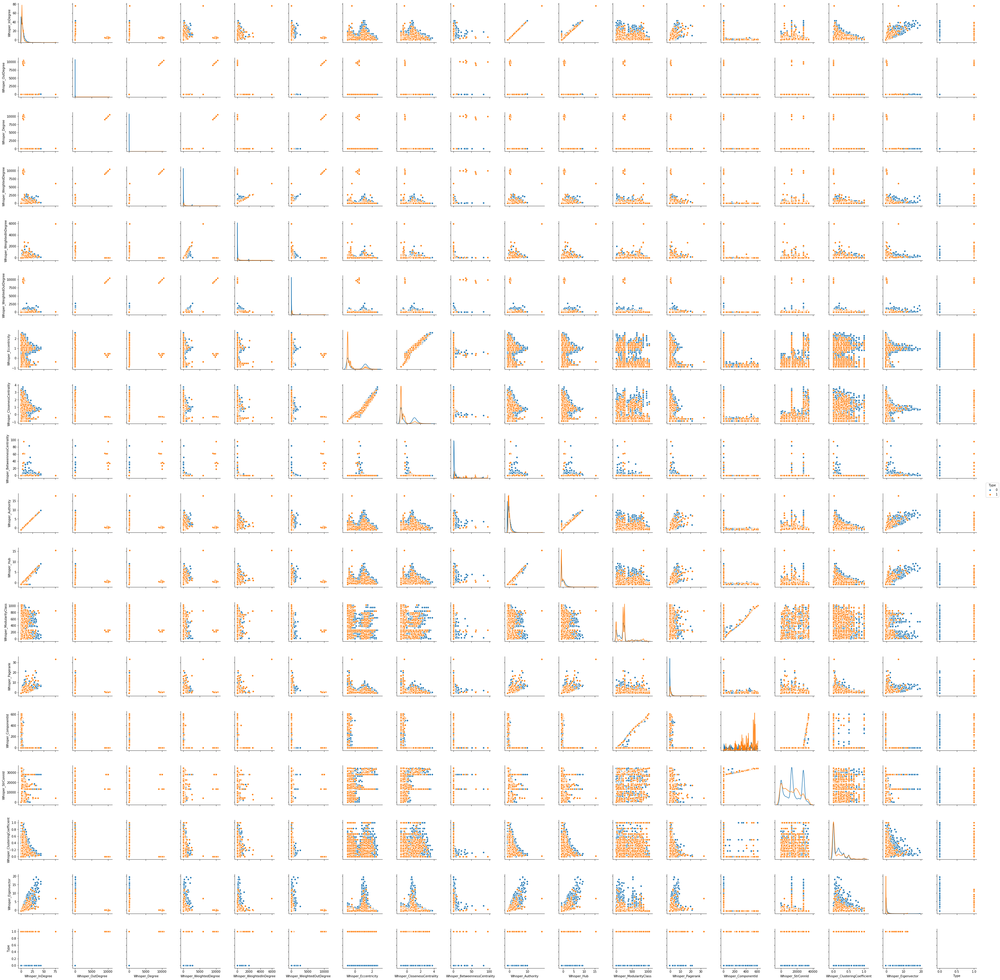

In [25]:
sns.pairplot(whisper_df, diag_kind="kde", hue="Type")

In [16]:
# Checkpoint 
nm_df_zscored = nm_df.copy()

In [17]:
# We will log transform the data for all the columns that have high peak and long thick tail

In [18]:
X_cols_to_log_transform = [
    'PartyPlay_InDegree', 'PartyPlay_OutDegree', 'PartyPlay_WeightedInDegree', 'PartyPlay_WeightedOutDegree',
    'Friendship_InDegree', 'Friendship_OutDegree', 'Friendship_WeightedInDegree', 'Friendship_WeightedOutDegree',
    'Trade_InDegree', 'Trade_OutDegree', 'Trade_WeightedInDegree', 'Trade_WeightedOutDegree',
    'Mail_InDegree', 'Mail_OutDegree', 'Mail_WeightedInDegree', 'Mail_WeightedOutDegree',
    'Shop_InDegree', 'Shop_OutDegree', 'Shop_WeightedInDegree', 'Shop_WeightedOutDegree',
    'Whisper_InDegree', 'Whisper_OutDegree', 'Whisper_WeightedInDegree', 'Whisper_WeightedOutDegree',
    'PartyPlay_Degree', 'PartyPlay_WeightedDegree', 'PartyPlay_BetweennessCentrality', 
    'Friendship_Degree', 'Friendship_WeightedDegree', 'Friendship_BetweennessCentrality',
    'Trade_Degree', 'Trade_WeightedDegree', 'Trade_BetweennessCentrality',
    'Shop_Degree', 'Shop_WeightedDegree', 'Shop_BetweennessCentrality',
    'Mail_Degree', 'Mail_WeightedDegree', 'Mail_BetweennessCentrality',
    'Whisper_Degree', 'Whisper_WeightedDegree', 'Whisper_BetweennessCentrality']

In [19]:
nm_df = nm_df_zscored.copy()

In [20]:
from scipy import stats as scipy_stats
from scipy.special import boxcox1p
from sklearn.preprocessing import PowerTransformer

nm_df_z_t_1 = nm_df_zscored.copy()
'''
transformer = PowerTransformer(method='yeo-johnson')
X = nm_df_z_t_1[X_cols_to_log_transform]
nm_df_z_t_1[X_cols_to_log_transform] = transformer.fit_transform(X)
'''
for col in X_cols_to_log_transform:
    #print("Transforming %s" % col)
    # The boxcox transformation with value of 0 does log transformation
    nm_df_z_t_1[col] = pd.Series(boxcox1p(nm_df_z_t_1[col].values, 0))
    nm_df_z_t_1[col] = pd.Series(boxcox1p(nm_df_z_t_1[col].values, 0))
    
    

In [21]:
nm_df_orig.PartyPlay_InDegree.value_counts().sort_index().tail(5)

753    1
757    1
790    1
806    1
876    1
Name: PartyPlay_InDegree, dtype: int64

In [22]:
# Lets see how the scaled value of above now looks like
nm_df_z_t_1.PartyPlay_InDegree.value_counts().sort_values().head(5)
# We have scaled down from 876 to value of 2

1.935416    1
1.925406    1
1.999933    1
1.918560    1
1.966898    1
Name: PartyPlay_InDegree, dtype: int64

In [45]:
#for col in X_cols_to_log_transform:
#    nm_df[col] = nm_df[col].apply(np.log).apply(np.log)
#    tmp = nm_df[col].copy()
#    negative_inf_indices = tmp[tmp == -np.inf].index
#    tmp.drop(negative_inf_indices, inplace=True)
#    nm_df[col].replace(to_replace=-np.inf, value=tmp.min(), inplace=True)
#    nm_df[col].replace(to_replace=np.inf, value=tmp.max(), inplace=True)
#    nm_df[col].replace(to_replace=np.nan, value=tmp.median(), inplace=True)

In [23]:
# Checkpoint 2
nm_df = nm_df_z_t_1.copy()

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


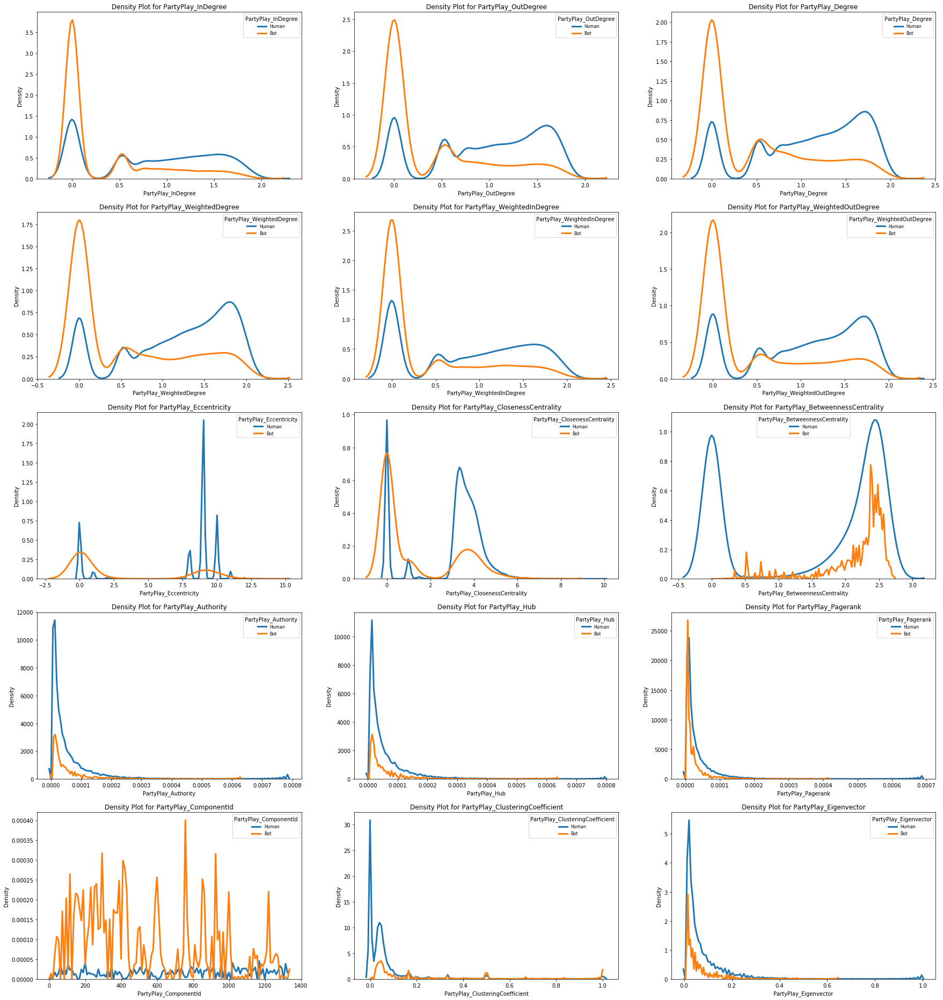

In [24]:
grid_spec = plt.GridSpec(nrows=6, ncols=3, wspace=0.2, hspace=0.2)

cols_to_view = [
    'PartyPlay_InDegree', 'PartyPlay_OutDegree', 'PartyPlay_Degree',
    'PartyPlay_WeightedDegree', 'PartyPlay_WeightedInDegree', 'PartyPlay_WeightedOutDegree',
    'PartyPlay_Eccentricity', 'PartyPlay_ClosenessCentrality', 'PartyPlay_BetweennessCentrality',
    'PartyPlay_Authority', 'PartyPlay_Hub','PartyPlay_Pagerank',
    'PartyPlay_ComponentId', 'PartyPlay_ClusteringCoefficient', 'PartyPlay_Eigenvector']

cols_to_view_arr = np.array(cols_to_view)
cols_to_view_arr = np.squeeze(cols_to_view_arr)
cols_to_view_matrix = cols_to_view_arr.reshape(5, 3)
#print(cols_to_view_matrix)

plt.figure(figsize=(30,40))
for x in range(5):
    for y in range(3):
        col = cols_to_view_matrix[x, y]
        plt.subplot(grid_spec[x, y])
        for player_type in [0, 1]:
            subset = nm_df[nm_df.Type == player_type]
            sns.distplot(subset[col], hist=False, kde=True,
                         kde_kws={'linewidth': 3}, label=type_dict.get(player_type))
        # Plot formatting
        plt.legend(prop={'size': 8}, title = col)
        plt.title('Density Plot for %s' % col)
        plt.xlabel(col)
        plt.ylabel('Density')

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


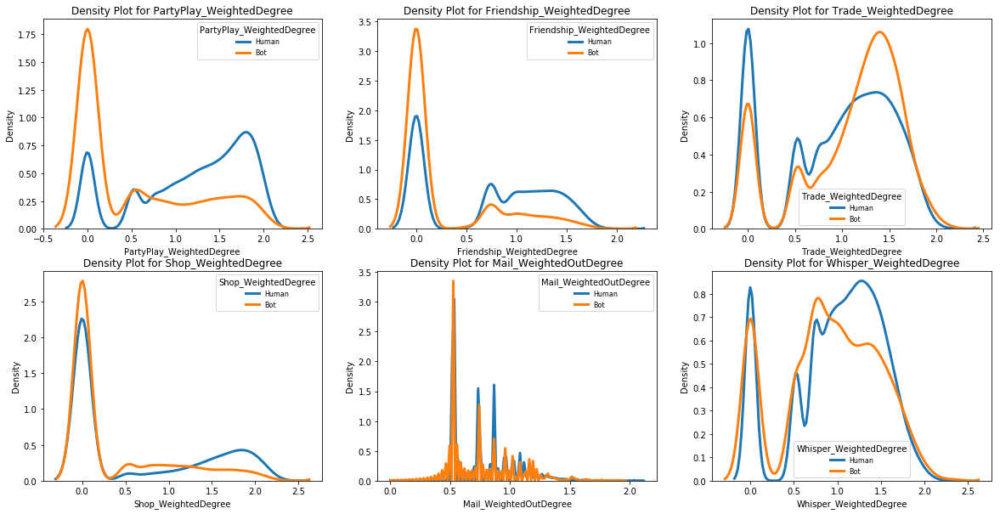

In [25]:
grid_spec = plt.GridSpec(nrows=2, ncols=3, wspace=0.2, hspace=0.2)

cols_to_view = [
    'PartyPlay_WeightedDegree',
    'Friendship_WeightedDegree',
    'Trade_WeightedDegree', 
    'Shop_WeightedDegree',
    'Mail_WeightedOutDegree',
    'Whisper_WeightedDegree', 
    ]

cols_to_view_arr = np.array(cols_to_view)
cols_to_view_arr = np.squeeze(cols_to_view_arr)
cols_to_view_matrix = cols_to_view_arr.reshape(2, 3)
#print(cols_to_view_matrix)

plt.figure(figsize=(20,10))
for x in range(2):
    for y in range(3):
        col = cols_to_view_matrix[x, y]
        plt.subplot(grid_spec[x, y])
        for player_type in [0, 1]:
            subset = nm_df[nm_df.Type == player_type]
            sns.distplot(subset[col], hist=False, kde=True,
                         kde_kws={'linewidth': 3}, label=type_dict.get(player_type))
        # Plot formatting
        plt.legend(prop={'size': 8}, title = col)
        plt.title('Density Plot for %s' % col)
        plt.xlabel(col)
        plt.ylabel('Density')

In [126]:
from scipy.stats import pearsonr
tranformations = {'x': lambda x: x, '1/x': lambda x: 1/x, 'x**2': lambda x: x**2,
 'x**3': lambda x: x**3, 'log(x)': lambda x: np.log(1+x)}
for transformation in tranformations:
 pearsonr_coef, pearsonr_p = pearsonr(nm_df.Type, tranformations[transformation](nm_df.PartyPlay_Degree))
 print('Transformation: %s t Pearson’s r: %0.3f' % (transformation, pearsonr_coef))
pearsonr_coef, pearsonr_p = pearsonr(nm_df.Type,
                                     pd.Series(boxcox1p(
                                     pd.Series(boxcox1p(nm_df_orig['PartyPlay_Degree'].values, 0)), 0)))
print('Transformation: %s t Pearson’s r: %0.3f' % ('log(x)', pearsonr_coef))

Transformation: x t Pearson’s r: -0.313
Transformation: 1/x t Pearson’s r: 0.015
Transformation: x**2 t Pearson’s r: 0.089
Transformation: x**3 t Pearson’s r: -0.259
Transformation: log(x) t Pearson’s r: nan
Transformation: log(x) t Pearson’s r: -0.359


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in log
  This is separate from the ipykernel package so we can avoid doing imports until


In [26]:
nm_df_orig.columns = col_names
print(nm_df.PartyPlay_InDegree[11])
print(nm_df_orig.PartyPlay_InDegree[11])

0.0
0


In [27]:
nm_df.isna().any()

Actor                               False
A_Acc                               False
PartyPlay_InDegree                  False
PartyPlay_OutDegree                 False
PartyPlay_Degree                    False
PartyPlay_WeightedDegree            False
PartyPlay_WeightedInDegree          False
PartyPlay_WeightedOutDegree         False
PartyPlay_Eccentricity              False
PartyPlay_ClosenessCentrality       False
PartyPlay_BetweennessCentrality     False
PartyPlay_Authority                 False
PartyPlay_Hub                       False
PartyPlay_ModularityClass           False
PartyPlay_Pagerank                  False
PartyPlay_ComponentId               False
PartyPlay_StrConnId                 False
PartyPlay_ClusteringCoefficient     False
PartyPlay_Eigenvector               False
Friendship_InDegree                 False
Friendship_OutDegree                False
Friendship_Degree                   False
Friendship_WeightedDegree           False
Friendship_WeightedInDegree       

In [28]:
# Creating different datasets based on the Group activity
party_df_1 = nm_df[[
                  'PartyPlay_InDegree', 'PartyPlay_OutDegree', 'PartyPlay_Degree',
                  'PartyPlay_WeightedDegree', 'PartyPlay_WeightedInDegree', 'PartyPlay_WeightedOutDegree',
                  'PartyPlay_Eccentricity', 'PartyPlay_ClosenessCentrality', 'PartyPlay_BetweennessCentrality',
                  'PartyPlay_Authority', 'PartyPlay_Hub', 'PartyPlay_ModularityClass', 'PartyPlay_Pagerank',
                  'PartyPlay_ComponentId', 'PartyPlay_StrConnId', 'PartyPlay_ClusteringCoefficient',
                  'PartyPlay_Eigenvector', 'Type']].copy()
friendship_df_1 = nm_df[['Friendship_InDegree', 'Friendship_OutDegree', 'Friendship_Degree',
                       'Friendship_WeightedDegree', 'Friendship_WeightedInDegree', 'Friendship_WeightedOutDegree',
                       'Friendship_Eccentricity', 'Friendship_ClosenessCentrality', 'Friendship_BetweennessCentrality',
                       'Friendship_Authority', 'Friendship_Hub', 'Friendship_ModularityClass', 'Friendship_Pagerank',
                       'Friendship_ComponentId', 'Friendship_StrConnId', 'Friendship_ClusteringCoefficient', 'Friendship_Eigenvector',
                       'Type']].copy()
trade_df_1 = nm_df[[
    'Trade_InDegree', 'Trade_OutDegree', 'Trade_Degree',
    'Trade_WeightedDegree', 'Trade_WeightedInDegree', 'Trade_WeightedOutDegree',
    'Trade_Eccentricity', 'Trade_ClosenessCentrality', 'Trade_BetweennessCentrality',
    'Trade_Authority', 'Trade_Hub', 'Trade_ModularityClass', 'Trade_Pagerank',
    'Trade_ComponentId', 'Trade_StrConnId', 'Trade_ClusteringCoefficient', 'Trade_Eigenvector',
    'Type']].copy()
shop_df_1 = nm_df[[
             'Shop_InDegree', 'Shop_OutDegree', 'Shop_Degree',
             'Shop_WeightedDegree', 'Shop_WeightedInDegree', 'Shop_WeightedOutDegree',
             'Shop_Eccentricity', 'Shop_ClosenessCentrality', 'Shop_BetweennessCentrality',
             'Shop_Authority', 'Shop_Hub', 'Shop_ModularityClass', 'Shop_Pagerank',
             'Shop_ComponentId', 'Shop_StrConnId', 'Shop_ClusteringCoefficient', 'Shop_Eigenvector',
             'Type']].copy()
whisper_df_1 = nm_df[[
    'Whisper_InDegree', 'Whisper_OutDegree', 'Whisper_Degree',
    'Whisper_WeightedDegree', 'Whisper_WeightedInDegree', 'Whisper_WeightedOutDegree',
    'Whisper_Eccentricity', 'Whisper_ClosenessCentrality', 'Whisper_BetweennessCentrality',
    'Whisper_Authority', 'Whisper_Hub', 'Whisper_ModularityClass', 'Whisper_Pagerank',
    'Whisper_ComponentId', 'Whisper_StrConnId', 'Whisper_ClusteringCoefficient', 'Whisper_Eigenvector',
    'Type' ]].copy()
mail_df_1 = nm_df[[
    'Mail_InDegree', 'Mail_OutDegree', 'Mail_Degree',
    'Mail_WeightedDegree', 'Mail_WeightedInDegree', 'Mail_WeightedOutDegree',
    'Mail_Eccentricity', 'Mail_ClosenessCentrality', 'Mail_BetweennessCentrality',
    'Mail_Authority', 'Mail_Hub', 'Mail_ModularityClass', 'Mail_Pagerank',
    'Mail_ComponentId', 'Mail_StrConnId', 'Mail_ClusteringCoefficient', 'Mail_Eigenvector',
    'Type']].copy()


In [29]:
X_cols = ['PartyPlay_InDegree', 'PartyPlay_OutDegree', 'PartyPlay_WeightedInDegree', 'PartyPlay_WeightedOutDegree',
    'PartyPlay_ClusteringCoefficient',
    'Friendship_InDegree', 'Friendship_OutDegree', 'Friendship_WeightedInDegree', 'Friendship_WeightedOutDegree',
    'Friendship_ClusteringCoefficient',
    'Trade_InDegree', 'Trade_OutDegree', 'Trade_WeightedInDegree', 'Trade_WeightedOutDegree',
    'Trade_ClusteringCoefficient',
    'Mail_InDegree', 'Mail_OutDegree', 'Mail_WeightedInDegree', 'Mail_WeightedOutDegree',
    'Mail_ClusteringCoefficient',
    'Shop_InDegree', 'Shop_OutDegree', 'Shop_WeightedInDegree', 'Shop_WeightedOutDegree',
    'Shop_ClusteringCoefficient', 
    'Whisper_InDegree', 'Whisper_OutDegree', 'Whisper_WeightedInDegree', 'Whisper_WeightedOutDegree',
    'Whisper_ClusteringCoefficient',
    'PartyPlay_Degree', 'PartyPlay_WeightedDegree', 'PartyPlay_BetweennessCentrality', 'PartyPlay_ClosenessCentrality', 
    'PartyPlay_Eigenvector', 'PartyPlay_Eccentricity', 'PartyPlay_Authority', 'PartyPlay_Hub', 'PartyPlay_Pagerank',
    'Friendship_Degree', 'Friendship_WeightedDegree', 'Friendship_BetweennessCentrality', 'Friendship_ClosenessCentrality', 
    'Friendship_Eigenvector', 'Friendship_Eccentricity', 'Friendship_Authority', 'Friendship_Hub', 'Friendship_Pagerank',
    'Trade_Degree', 'Trade_WeightedDegree', 'Trade_BetweennessCentrality',  'Trade_ClosenessCentrality',
    'Trade_Eigenvector', 'Trade_Eccentricity', 'Trade_Authority', 'Trade_Hub', 'Trade_Pagerank',
    'Shop_Degree', 'Shop_WeightedDegree', 'Shop_BetweennessCentrality', 'Shop_ClosenessCentrality',
    'Shop_Eigenvector', 'Shop_Eccentricity', 'Shop_Authority', 'Shop_Hub', 'Shop_Pagerank',
    'Mail_Degree', 'Mail_WeightedDegree', 'Mail_BetweennessCentrality', 'Mail_ClosenessCentrality', 
    'Mail_Eigenvector', 'Mail_Eccentricity', 'Mail_Authority', 'Mail_Hub', 'Mail_Pagerank']
#X_cols = ['PartyPlay_InDegree', 'PartyPlay_OutDegree', 'PartyPlay_WeightedInDegree', 'PartyPlay_WeightedOutDegree',
#    'PartyPlay_ClusteringCoefficient', 'PartyPlay_Degree', 'PartyPlay_WeightedDegree', 'PartyPlay_BetweennessCentrality', 'PartyPlay_ClosenessCentrality', 
#    'PartyPlay_Eigenvector', 'PartyPlay_Eccentricity', 'PartyPlay_Authority', 'PartyPlay_Hub', 'PartyPlay_Pagerank']
y_col = ['Type']
X = nm_df[X_cols]
y = nm_df[y_col]

In [95]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=7)

In [96]:
for model_name, model in models:
    print("Running model %s" % model_name)
    model.fit(X_train, y_train)
    y_predict = model.predict(X_test)
    score = model.score(X_test, y_test)
    print("Confusion Matrix: ")
    print(metrics.confusion_matrix(y_test, y_predict))
    print("Overall precision of %s: %s" % (model_name, precision_score(y_test, y_predict)))
    print("Overall recall of %s: %s" % (model_name, recall_score(y_test, y_predict)))
    print("Overall F1 Score of %s: %s" % (model_name, f1_score(y_test, y_predict)))
    print("Classification Report: ")
    print(classification_report(y_test, y_predict, [0, 1]))

Running model LR


/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Confusion Matrix: 
[[12439   233]
 [ 1133  1117]]
Overall precision of LR: 0.8274074074074074
Overall recall of LR: 0.49644444444444447
Overall F1 Score of LR: 0.6205555555555556
Classification Report: 
              precision    recall  f1-score   support

           0       0.92      0.98      0.95     12672
           1       0.83      0.50      0.62      2250

   micro avg       0.91      0.91      0.91     14922
   macro avg       0.87      0.74      0.78     14922
weighted avg       0.90      0.91      0.90     14922



In [97]:
# We will cluster each of the cols in cols_to_zscore and assign a cluster number to each, replacing its original value
# by its cluster number. This is to make the model better as it will then the model will not have to get build
# on scatter values, but on values which represents its cluster, which are very less in number. We do this for
# every such feature in cols_to_zscore on not just on the all the features taken as whole.
k_means_cluster_num = 3

In [98]:
# For each feature, get predicted cluster. Put the resultant cluster value of the feature against new nm_df dataframe
nm_df_z_t_c = nm_df_z_t_1.copy()
for act_name, act_df in grp_act_df.items():
    act_cols = cols_to_zscore.get(act_name)
    for act_col in act_cols:
        tmp_df = pd.DataFrame({act_col: act_df[act_col].copy()})
        clusters = KMeans(n_clusters=k_means_cluster_num, random_state=7, n_init=10)
        clusters.fit(tmp_df)
        predicted_clusters_array = clusters.predict(tmp_df)
        nm_df_z_t_c[act_col] = predicted_clusters_array

In [99]:
X = nm_df_z_t_c[X_cols]
y = nm_df_z_t_c[y_col]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=7)

In [100]:
models = []
models.append(("LR", LogisticRegression()))


In [101]:
for model_name, model in models:
    print("Running model %s" % model_name)
    model.fit(X_train, y_train)
    y_predict = model.predict(X_test)
    score = model.score(X_test, y_test)
    print("Model Score %s " % score)
    print("Confusion Matrix: ")
    print(metrics.confusion_matrix(y_test, y_predict))
    print("Overall precision of %s: %s" % (model_name, precision_score(y_test, y_predict)))
    print("Overall recall of %s: %s" % (model_name, recall_score(y_test, y_predict)))
    print("Overall F1 Score of %s: %s" % (model_name, f1_score(y_test, y_predict)))
    print("Classification Report: ")
    print(classification_report(y_test, y_predict, [0, 1]))
    print("----------------------------------------------------- \n\n")

Running model LR


/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Model Score 0.907318053880177 
Confusion Matrix: 
[[12434   238]
 [ 1145  1105]]
Overall precision of LR: 0.8227848101265823
Overall recall of LR: 0.4911111111111111
Overall F1 Score of LR: 0.6150848872808238
Classification Report: 
              precision    recall  f1-score   support

           0       0.92      0.98      0.95     12672
           1       0.82      0.49      0.62      2250

   micro avg       0.91      0.91      0.91     14922
   macro avg       0.87      0.74      0.78     14922
weighted avg       0.90      0.91      0.90     14922

----------------------------------------------------- 




/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/data.py:617: DataConversionWarning: Data with input dtype int32, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/anaconda3/lib/python3.6/site-packages/sklearn/base.py:462: DataConversionWarning: Data with input dtype int32, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


75.00150790140341
75


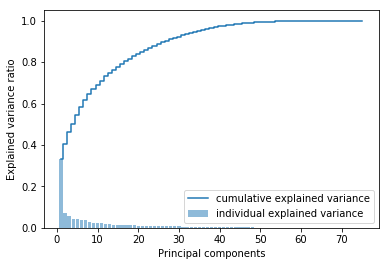

In [102]:
X = nm_df_z_t_c[X_cols]
y = nm_df_z_t_c[y_col]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=7)

sc = StandardScaler()
X_std = sc.fit_transform(X)
cov_matrix = np.cov(X_std.T)
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)
tot = sum(eigenvalues)
print(tot)
var_explained = [(i / tot) for i in sorted(eigenvalues, reverse=True)]  # an array of variance explained by each 
# eigen vector... there will be 8 entries as there are 8 eigen vectors)
cum_var_exp = np.cumsum(var_explained)  # an array of cumulative variance. There will be 8 entries with 8 th entry 
# cumulative reaching almost 100%
print(len(eigenvalues))
plt.bar(range(1,76), var_explained, alpha=0.5, align='center', label='individual explained variance')
plt.step(range(1,76),cum_var_exp, where= 'mid', label='cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal components')
plt.legend(loc = 'best')
plt.show()

In [103]:
# From the PCA, we can see that we can get 95% of variance with around 50 PCA columns as opposed to original 76.
# We could use the new PCA columns for the model. But since the reduction of columns is not drastic, we plan to go
# with the original set of columns.

In [104]:
X = nm_df_z_t_c[X_cols]
y = nm_df_z_t_c[y_col]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=7)

In [105]:
results = []
model_names = []
models = []
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC()))
for model_name, model in models:
    kfold_cv = model_selection.KFold(n_splits=10, random_state=23)
    cv_results = model_selection.cross_val_score(model, X, y, cv=kfold_cv, scoring='accuracy')
    #print(model_name, cv_results)
    results.append(cv_results)
    model_names.append(model_name)
    msg = "%s: %f (%f)" % (model_name, cv_results.mean(), cv_results.std())
    print(msg)


/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:43

LR: 0.902370 (0.019292)


/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example usin

LDA: 0.900018 (0.014753)


/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning: A column-vector y was passed when

KNN: 0.900521 (0.021274)
CART: 0.850661 (0.011727)


/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example usin

NB: 0.590317 (0.081108)


/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/anaconda3/lib/python3.6/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/anaconda3/lib/python3.6/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better 

SVM: 0.901265 (0.024899)


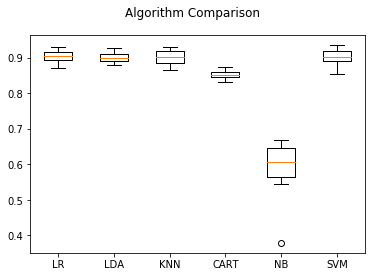

In [106]:
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(model_names)
plt.show()

In [168]:
# From the above, Logistic Regression, Linear Disriminant Analysis, K nearest neighbor and Support Vector Classfier
# provides a accuracy close to 90%. We can choose any of these for final modeling.

In [107]:
results = []
model_names = []
models = []
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC()))
auc_metrics = []
for model_name, model in models:
    print("Running model %s" % model_name)
    model.fit(X_train, y_train)
    y_predict = model.predict(X_test)
    score = model.score(X_test, y_test)
    print("Model score %s" % score)
    print("Confusion Matrix: ")
    print(metrics.confusion_matrix(y_test, y_predict))
    print("Overall precision of %s: %s" % (model_name, precision_score(y_test, y_predict)))
    print("Overall recall of %s: %s" % (model_name, recall_score(y_test, y_predict)))
    print("Overall F1 Score of %s: %s" % (model_name, f1_score(y_test, y_predict)))
    print("Classification Report: ")
    print(classification_report(y_test, y_predict, [0, 1]))
    fpr, tpr, threshold = roc_curve(y_test, y_predict)
    roc_auc = auc(fpr, tpr)
    auc_metrics.append((model_name, fpr, tpr, roc_auc))



Running model LR


/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Model score 0.907318053880177
Confusion Matrix: 
[[12434   238]
 [ 1145  1105]]
Overall precision of LR: 0.8227848101265823
Overall recall of LR: 0.4911111111111111
Overall F1 Score of LR: 0.6150848872808238
Classification Report: 
              precision    recall  f1-score   support

           0       0.92      0.98      0.95     12672
           1       0.82      0.49      0.62      2250

   micro avg       0.91      0.91      0.91     14922
   macro avg       0.87      0.74      0.78     14922
weighted avg       0.90      0.91      0.90     14922

Running model LDA


/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Model score 0.9045704329178395
Confusion Matrix: 
[[12328   344]
 [ 1080  1170]]
Overall precision of LDA: 0.7727873183619551
Overall recall of LDA: 0.52
Overall F1 Score of LDA: 0.6216790648246546
Classification Report: 
              precision    recall  f1-score   support

           0       0.92      0.97      0.95     12672
           1       0.77      0.52      0.62      2250

   micro avg       0.90      0.90      0.90     14922
   macro avg       0.85      0.75      0.78     14922
weighted avg       0.90      0.90      0.90     14922

Running model KNN


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  del sys.path[0]


Model score 0.9099986596970916
Confusion Matrix: 
[[12384   288]
 [ 1055  1195]]
Overall precision of KNN: 0.8057990559676331
Overall recall of KNN: 0.5311111111111111
Overall F1 Score of KNN: 0.640235735333512
Classification Report: 
              precision    recall  f1-score   support

           0       0.92      0.98      0.95     12672
           1       0.81      0.53      0.64      2250

   micro avg       0.91      0.91      0.91     14922
   macro avg       0.86      0.75      0.79     14922
weighted avg       0.90      0.91      0.90     14922

Running model CART
Model score 0.8608095429567082
Confusion Matrix: 
[[11581  1091]
 [  986  1264]]
Overall precision of CART: 0.5367303609341826
Overall recall of CART: 0.5617777777777778
Overall F1 Score of CART: 0.5489685124864279
Classification Report: 
              precision    recall  f1-score   support

           0       0.92      0.91      0.92     12672
           1       0.54      0.56      0.55      2250

   micro avg    

/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/anaconda3/lib/python3.6/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


Model score 0.9062458115534111
Confusion Matrix: 
[[12511   161]
 [ 1238  1012]]
Overall precision of SVM: 0.8627450980392157
Overall recall of SVM: 0.4497777777777778
Overall F1 Score of SVM: 0.5912941863862109
Classification Report: 
              precision    recall  f1-score   support

           0       0.91      0.99      0.95     12672
           1       0.86      0.45      0.59      2250

   micro avg       0.91      0.91      0.91     14922
   macro avg       0.89      0.72      0.77     14922
weighted avg       0.90      0.91      0.89     14922



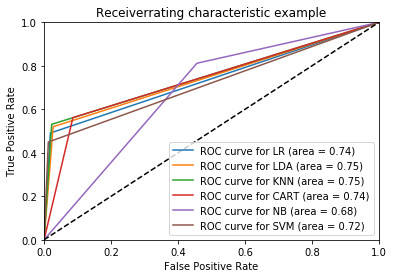

In [108]:
# Plot ROC curve
plt.clf()
for model_name, fpr, tpr, roc_auc in auc_metrics:
    plt.plot(fpr, tpr, label='ROC curve for %s (area = %0.2f)' % (model_name, roc_auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiverrating characteristic example')
plt.legend(loc="lower right")
plt.show()

In [130]:
X = nm_df_z_t_c[X_cols]
y = nm_df_z_t_c[y_col]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=7)


base_model = KNeighborsClassifier(n_neighbors=10)
model_name = 'KNN'
auc_metrics = []
classfiers = [
    ('Bagging Classifier', BaggingClassifier(base_estimator=base_model, n_estimators=50, max_samples=0.7)),
    #('AdaBoost Classifier', AdaBoostClassifier(base_estimator=base_model, n_estimators= 50)),
    #('Gradient Boost Classfier', GradientBoostingClassifier(n_estimators = 50, learning_rate = 0.05)),
    #('Random Forest Classifier', RandomForestClassifier(n_estimators = 50))
]
for classifier_name, classifier in classfiers:
    print("Running %s" % classifier_name)
    classifier.fit(X_train, y_train)
    y_predict = classifier.predict(X_test)
    score = classifier.score(X_test, y_test)
    print("Model score %s" % score)
    print("Confusion Matrix: ")
    print(metrics.confusion_matrix(y_test, y_predict))
    print("Overall precision of %s: %s" % (model_name, precision_score(y_test, y_predict)))
    print("Overall recall of %s: %s" % (model_name, recall_score(y_test, y_predict)))
    print("Overall F1 Score of %s: %s" % (model_name, f1_score(y_test, y_predict)))
    print("Classification Report: ")
    print(classification_report(y_test, y_predict, [0, 1]))
    fpr, tpr, threshold = roc_curve(y_test, y_predict)
    roc_auc = auc(fpr, tpr)
    print("AUC %s" % roc_auc)
    auc_metrics.append((model_name, fpr, tpr, roc_auc))
    print("-------------------------------------------------")

Running Bagging Classifier


/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/bagging.py:618: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


KeyboardInterrupt: 

In [124]:

X = nm_df_z_t_c[X_cols]
y = nm_df_z_t_c[y_col]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=7)

print(type(y_train))

model = KNeighborsClassifier(n_neighbors=10)
model_name = 'KNN'
auc_metrics = []

# Running logistic regression after Resampling the data using ClusterCentroids
from imblearn.under_sampling import ClusterCentroids
from imblearn.over_sampling import SMOTE
#cc = ClusterCentroids()  

print("Before UpSampling, counts of label 1: %d" % (sum(y_train.values==1)))
print("Before UpSampling, counts of label 0: %d" % (sum(y_train.values==0)))
sm = SMOTE(sampling_strategy = 1, k_neighbors = 5, random_state=1)   #Synthetic Minority Over Sampling Technique
X_train_resample, y_train_resample = sm.fit_sample(X_train, y_train)
#X_train_resample, y_train_resample = cc.fit_sample(X_train, y_train)
print("After UpSampling, counts of label '1': %s" % (sum(y_train_resample==1)))
print("After UpSampling, counts of label '0': %s" % (sum(y_train_resample==0)))
#print("After UpSampling, the shape of train_X: %s" % (X_train_resample.shape))
#print("After UpSampling, the shape of train_y: %s" % (y_train_resample.shape))

model.fit(X_train_resample, y_train_resample)
y_predict = model.predict(X_test)
score = model.score(X_test, y_test)
print("Model score %s" % score)
print("Confusion Matrix: ")
print(metrics.confusion_matrix(y_test, y_predict))
print("Overall precision of %s: %s" % (model_name, precision_score(y_test, y_predict)))
print("Overall recall of %s: %s" % (model_name, recall_score(y_test, y_predict)))
print("Overall F1 Score of %s: %s" % (model_name, f1_score(y_test, y_predict)))
print("Classification Report: ")
print(classification_report(y_test, y_predict, [0, 1]))
fpr, tpr, threshold = roc_curve(y_test, y_predict)
roc_auc = auc(fpr, tpr)
print("AUC %s" % roc_auc)
auc_metrics.append((model_name, fpr, tpr, roc_auc))
print("-------------------------------------------------")

<class 'pandas.core.frame.DataFrame'>
Before UpSampling, counts of label 1: 5452
Before UpSampling, counts of label 0: 29365


/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


After UpSampling, counts of label '1': 29365
After UpSampling, counts of label '0': 29365
Model score 0.8153732743600054
Confusion Matrix: 
[[10626  2046]
 [  709  1541]]
Overall precision of KNN: 0.42960691385558963
Overall recall of KNN: 0.6848888888888889
Overall F1 Score of KNN: 0.528010964536577
Classification Report: 
              precision    recall  f1-score   support

           0       0.94      0.84      0.89     12672
           1       0.43      0.68      0.53      2250

   micro avg       0.82      0.82      0.82     14922
   macro avg       0.68      0.76      0.71     14922
weighted avg       0.86      0.82      0.83     14922

AUC 0.7617152777777777
-------------------------------------------------


In [129]:

X = nm_df_z_t_c[X_cols]
y = nm_df_z_t_c[y_col]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=7)

print(type(y_train))

model = KNeighborsClassifier(n_neighbors=10)
model_name = 'KNN'
auc_metrics = []

# Running logistic regression after Resampling the data using ClusterCentroids
from imblearn.under_sampling import ClusterCentroids
from imblearn.over_sampling import SMOTE
cc = ClusterCentroids()  

print("Before DownSampling, counts of label 1: %d" % (sum(y_train.values==1)))
print("Before DownSampling, counts of label 0: %d" % (sum(y_train.values==0)))
#sm = SMOTE(sampling_strategy = 1, k_neighbors = 5, random_state=1)   #Synthetic Minority Over Sampling Technique
#X_train_resample, y_train_resample = sm.fit_sample(X_train, y_train)
X_train_resample, y_train_resample = cc.fit_sample(X_train, y_train)
print("After DownSampling, counts of label '1': %s" % (sum(y_train_resample==1)))
print("After DownSampling, counts of label '0': %s" % (sum(y_train_resample==0)))
#print("After UpSampling, the shape of train_X: %s" % (X_train_resample.shape))
#print("After UpSampling, the shape of train_y: %s" % (y_train_resample.shape))

model.fit(X_train_resample, y_train_resample)
y_predict = model.predict(X_test)
score = model.score(X_test, y_test)
print("Model score %s" % score)
print("Confusion Matrix: ")
print(metrics.confusion_matrix(y_test, y_predict))
print("Overall precision of %s: %s" % (model_name, precision_score(y_test, y_predict)))
print("Overall recall of %s: %s" % (model_name, recall_score(y_test, y_predict)))
print("Overall F1 Score of %s: %s" % (model_name, f1_score(y_test, y_predict)))
print("Classification Report: ")
print(classification_report(y_test, y_predict, [0, 1]))
fpr, tpr, threshold = roc_curve(y_test, y_predict)
roc_auc = auc(fpr, tpr)
print("AUC %s" % roc_auc)
auc_metrics.append((model_name, fpr, tpr, roc_auc))
print("-------------------------------------------------")

<class 'pandas.core.frame.DataFrame'>
Before DownSampling, counts of label 1: 5452
Before DownSampling, counts of label 0: 29365


/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


After DownSampling, counts of label '1': 5452
After DownSampling, counts of label '0': 5452
Model score 0.7805924138855381
Confusion Matrix: 
[[9987 2685]
 [ 589 1661]]
Overall precision of KNN: 0.38219052001840775
Overall recall of KNN: 0.7382222222222222
Overall F1 Score of KNN: 0.5036385688295937
Classification Report: 
              precision    recall  f1-score   support

           0       0.94      0.79      0.86     12672
           1       0.38      0.74      0.50      2250

   micro avg       0.78      0.78      0.78     14922
   macro avg       0.66      0.76      0.68     14922
weighted avg       0.86      0.78      0.81     14922

AUC 0.7631688762626263
-------------------------------------------------


In [127]:


X = nm_df_z_t_c[X_cols]
y = nm_df_z_t_c[y_col]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=7)

print(type(y_train))

model = KNeighborsClassifier(n_neighbors=10)
model_name = 'KNN'
auc_metrics = []

# Running logistic regression after Resampling the data using ClusterCentroids
from imblearn.under_sampling import ClusterCentroids
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler

ros = RandomOverSampler()


print("Before DownSampling, counts of label 1: %d" % (sum(y_train.values==1)))
print("Before DownSampling, counts of label 0: %d" % (sum(y_train.values==0)))
X_train_resample, y_train_resample = ros.fit_sample(X_train, y_train)
print("After DownSampling, counts of label '1': %s" % (sum(y_train_resample==1)))
print("After DownSampling, counts of label '0': %s" % (sum(y_train_resample==0)))
#print("After UpSampling, the shape of train_X: %s" % (X_train_resample.shape))
#print("After UpSampling, the shape of train_y: %s" % (y_train_resample.shape))

model.fit(X_train_resample, y_train_resample)
y_predict = model.predict(X_test)
score = model.score(X_test, y_test)
print("Model score %s" % score)
print("Confusion Matrix: ")
print(metrics.confusion_matrix(y_test, y_predict))
print("Overall precision of %s: %s" % (model_name, precision_score(y_test, y_predict)))
print("Overall recall of %s: %s" % (model_name, recall_score(y_test, y_predict)))
print("Overall F1 Score of %s: %s" % (model_name, f1_score(y_test, y_predict)))
print("Classification Report: ")
print(classification_report(y_test, y_predict, [0, 1]))
fpr, tpr, threshold = roc_curve(y_test, y_predict)
roc_auc = auc(fpr, tpr)
print("AUC %s" % roc_auc)
auc_metrics.append((model_name, fpr, tpr, roc_auc))
print("-------------------------------------------------")

<class 'pandas.core.frame.DataFrame'>
Before DownSampling, counts of label 1: 5452
Before DownSampling, counts of label 0: 29365


/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


After DownSampling, counts of label '1': 29365
After DownSampling, counts of label '0': 29365
Model score 0.8234821069561721
Confusion Matrix: 
[[10766  1906]
 [  728  1522]]
Overall precision of KNN: 0.44399066511085183
Overall recall of KNN: 0.6764444444444444
Overall F1 Score of KNN: 0.5361042620641071
Classification Report: 
              precision    recall  f1-score   support

           0       0.94      0.85      0.89     12672
           1       0.44      0.68      0.54      2250

   micro avg       0.82      0.82      0.82     14922
   macro avg       0.69      0.76      0.71     14922
weighted avg       0.86      0.82      0.84     14922

AUC 0.7630170454545454
-------------------------------------------------


In [128]:


X = nm_df_z_t_c[X_cols]
y = nm_df_z_t_c[y_col]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=7)

print(type(y_train))

model = KNeighborsClassifier(n_neighbors=10)
model_name = 'KNN'
auc_metrics = []

# Running logistic regression after Resampling the data using ClusterCentroids
from imblearn.under_sampling import ClusterCentroids
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

rus = RandomUnderSampler()


print("Before DownSampling, counts of label 1: %d" % (sum(y_train.values==1)))
print("Before DownSampling, counts of label 0: %d" % (sum(y_train.values==0)))
X_train_resample, y_train_resample = rus.fit_sample(X_train, y_train)
print("After DownSampling, counts of label '1': %s" % (sum(y_train_resample==1)))
print("After DownSampling, counts of label '0': %s" % (sum(y_train_resample==0)))
#print("After UpSampling, the shape of train_X: %s" % (X_train_resample.shape))
#print("After UpSampling, the shape of train_y: %s" % (y_train_resample.shape))

model.fit(X_train_resample, y_train_resample)
y_predict = model.predict(X_test)
score = model.score(X_test, y_test)
print("Model score %s" % score)
print("Confusion Matrix: ")
print(metrics.confusion_matrix(y_test, y_predict))
print("Overall precision of %s: %s" % (model_name, precision_score(y_test, y_predict)))
print("Overall recall of %s: %s" % (model_name, recall_score(y_test, y_predict)))
print("Overall F1 Score of %s: %s" % (model_name, f1_score(y_test, y_predict)))
print("Classification Report: ")
print(classification_report(y_test, y_predict, [0, 1]))
fpr, tpr, threshold = roc_curve(y_test, y_predict)
roc_auc = auc(fpr, tpr)
print("AUC %s" % roc_auc)
auc_metrics.append((model_name, fpr, tpr, roc_auc))
print("-------------------------------------------------")

<class 'pandas.core.frame.DataFrame'>
Before DownSampling, counts of label 1: 5452
Before DownSampling, counts of label 0: 29365
After DownSampling, counts of label '1': [5452]
After DownSampling, counts of label '0': [5452]


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:30: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Model score 0.8774963141670017
Confusion Matrix: 
[[11590  1082]
 [  746  1504]]
Overall precision of KNN: 0.5815931941221965
Overall recall of KNN: 0.6684444444444444
Overall F1 Score of KNN: 0.6220016542597189
Classification Report: 
              precision    recall  f1-score   support

           0       0.94      0.91      0.93     12672
           1       0.58      0.67      0.62      2250

   micro avg       0.88      0.88      0.88     14922
   macro avg       0.76      0.79      0.77     14922
weighted avg       0.89      0.88      0.88     14922

AUC 0.7915296717171717
-------------------------------------------------


In [131]:
#param_grid = {'n_neighbors': [2, 5, 10, 20],
#              'algorithm': ['brute'] }
param_grid = {'n_neighbors': [2, 5, 10, 20],
              'leaf_size':[1,2,3,5],
              'weights':['uniform', 'distance'],
              'algorithm':['auto', 'ball_tree','kd_tree','brute'],
              'n_jobs':[-1]}
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
gs = RandomizedSearchCV(KNeighborsClassifier(), param_grid, cv=3)
X = nm_df_z_t_c[X_cols]
y = nm_df_z_t_c[y_col]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=7)
gs.fit(X_train, y_train)
print(gs.best_params_)

/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning: A column-vector y was passed when

/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:740: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


{'weights': 'distance', 'n_neighbors': 20, 'n_jobs': -1, 'leaf_size': 3, 'algorithm': 'ball_tree'}


In [138]:
model, model_name = KNeighborsClassifier(n_neighbors=30, algorithm='ball_tree', leaf_size=3, n_jobs=-1), 'KNN'
X = nm_df_z_t_c[X_cols]
y = nm_df_z_t_c[y_col]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=7)

print("Running model %s" % model_name)
model.fit(X_train, y_train)
y_predict = model.predict(X_test)
score = model.score(X_test, y_test)
print("Model score %s" % score)
print("Confusion Matrix: ")
print(metrics.confusion_matrix(y_test, y_predict))
print("Overall precision of %s: %s" % (model_name, precision_score(y_test, y_predict)))
print("Overall recall of %s: %s" % (model_name, recall_score(y_test, y_predict)))
print("Overall F1 Score of %s: %s" % (model_name, f1_score(y_test, y_predict)))
print("Classification Report: ")
print(classification_report(y_test, y_predict, [0, 1]))
fpr, tpr, threshold = roc_curve(y_test, y_predict)
roc_auc = auc(fpr, tpr)
auc_metrics.append((model_name, fpr, tpr, roc_auc))

Running model KNN


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  import sys


Model score 0.9108698565875888
Confusion Matrix: 
[[12449   223]
 [ 1107  1143]]
Overall precision of KNN: 0.8367496339677891
Overall recall of KNN: 0.508
Overall F1 Score of KNN: 0.6321902654867257
Classification Report: 
              precision    recall  f1-score   support

           0       0.92      0.98      0.95     12672
           1       0.84      0.51      0.63      2250

   micro avg       0.91      0.91      0.91     14922
   macro avg       0.88      0.75      0.79     14922
weighted avg       0.91      0.91      0.90     14922



In [139]:
print(roc_auc)

0.7452010732323232


In [144]:
model.predict_proba(X_test)[0:10, :]

array([[0.86666667, 0.13333333],
       [0.4       , 0.6       ],
       [0.13333333, 0.86666667],
       [0.93333333, 0.06666667],
       [0.93333333, 0.06666667],
       [0.96666667, 0.03333333],
       [1.        , 0.        ],
       [0.96666667, 0.03333333],
       [0.3       , 0.7       ],
       [1.        , 0.        ]])

In [143]:
y_pred_prob

array([0.13333333, 0.6       , 0.86666667, ..., 0.06666667, 0.33333333,
       0.06666667])